In [1]:
!pip install torchmetrics

You should consider upgrading via the '/usr/bin/python -m pip install --upgrade pip' command.


In [1]:
import ast
import glob
import json
import os
import re
import shutil
import sys

import albumentations as A
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
from IPython.core.interactiveshell import InteractiveShell
from PIL import Image
from torchvision.ops import box_iou
from tqdm import tqdm

InteractiveShell.ast_node_interactivity = "all"
import seaborn as sns
import torchmetrics
from IPython.display import clear_output
from sklearn.model_selection import (
    GroupKFold,
    KFold,
    StratifiedGroupKFold,
    StratifiedKFold,
)
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.io import read_image

In [3]:
TRAIN_DF_PART = "/app/_data/tensorflow-great-barrier-reef/train.csv"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
SEED = 38
DEVICE

'cuda'

## Dataset

In [4]:
df = pd.read_csv(TRAIN_DF_PART)
df["img_path"] = (
    "/app/_data/tensorflow-great-barrier-reef/train_images/video_"
    + df.video_id.astype("str")
    + "/"
    + df.video_frame.astype("str")
    + ".jpg"
)
df["annotations"] = df["annotations"].apply(lambda x: ast.literal_eval(x))
df["len_annotation"] = df["annotations"].str.len()
df["image_id"] = df["image_id"].str.replace("-", "_", regex=True)
df["new_img_path"] = f"/app/_data/images/" + df["image_id"] + ".jpg"
df["label"] = df["len_annotation"].apply(lambda x: 0 if x == 0 else 1)
df["no_label"] = df["len_annotation"].apply(lambda x: True if x == 0 else False)

In [5]:
df["label_change"] = df["label"] & df["no_label"].shift(1) & df["no_label"].shift(
    2
) | df["no_label"] & df["label"].shift(1) & df["label"].shift(2)
df["sequense_change"] = df["sequence"] != df["sequence"].shift(1)
df["start_subseq"] = df["sequense_change"] | df["label_change"]
df.loc[df.index[-1], "start_subseq"] = True
df["start_subseq"].sum()

138

In [6]:
start_idx = 0
for subsequence_id, end_idx in enumerate(df[df["start_subseq"]].index):
    df.loc[start_idx:end_idx, "subsequence_id"] = subsequence_id
    start_idx = end_idx

df["subsequence_id"] = df["subsequence_id"].astype(int)
df["subsequence_id"].nunique()

137

In [7]:
cut_df = pd.read_csv("/app/_data/cut_df.csv")
cut_df.sample(10)

,image_id,new_img_id,label,bboxes,n_bboxes,npy_path
140304,2_8490,2_8490_3,0,NaN,0,/app/_data/npy_380/2_8490_3.npy
101121,2_940,2_940_6,0,NaN,0,/app/_data/npy_380/2_940_6.npy
139319,2_8367,2_8367_2,0,NaN,0,/app/_data/npy_380/2_8367_2.npy
135341,2_7832,2_7832_6,0,NaN,0,/app/_data/npy_380/2_7832_6.npy
14058,0_4146,0_4146_0,0,NaN,0,/app/_data/npy_380/0_4146_0.npy
74134,1_8492,1_8492_7,0,NaN,0,/app/_data/npy_380/1_8492_7.npy
117948,2_3916,2_3916_1,0,NaN,0,/app/_data/npy_380/2_3916_1.npy
10947,0_3757,0_3757_1,0,NaN,0,/app/_data/npy_380/0_3757_1.npy
53803,1_2500,1_2500_3,0,NaN,0,/app/_data/npy_380/1_2500_3.npy
56331,1_2831,1_2831_3,0,NaN,0,/app/_data/npy_380/1_2831_3.npy


In [8]:
cut_df["negative"] = cut_df["label"].replace({1: 0, 0: 1})

In [9]:
cut_df = cut_df.merge(
    df[["image_id", "sequence", "subsequence_id"]], on="image_id", how="left"
)

In [10]:
n_splits = 6
kf = GroupKFold(n_splits=n_splits)
list_train_ids = []
list_val_ids = []
for kfold, (train_idx, val_idx) in enumerate(
    kf.split(cut_df, y=cut_df.negative, groups=cut_df.sequence)
):
    list_train_ids.append(train_idx)
    list_val_ids.append(val_idx)
    print(
        kfold,
        cut_df.loc[list_train_ids[kfold]].query("negative==0").shape[0],
        cut_df.loc[list_val_ids[kfold]].query("negative==0").shape[0],
        cut_df.loc[list_train_ids[kfold]].query("negative==0").shape[0]
        / (cut_df.loc[list_val_ids[kfold]].query("negative==0").shape[0] + 1),
    )

0 9120 491 18.536585365853657
1 9580 31 299.375
2 7470 2141 3.4873949579831933
3 5622 3989 1.4090225563909775
4 7990 1621 4.926017262638718
5 8273 1338 6.1784914115011205


In [11]:
KFOLD = 5
cut_df.loc[list_train_ids[KFOLD]]["sequence"].unique()
cut_df.loc[list_train_ids[KFOLD]].shape
cut_df.loc[list_val_ids[KFOLD]]["sequence"].unique()
cut_df.loc[list_val_ids[KFOLD]].shape

array([40258, 45518, 45015, 53708,   996, 44160, 15827, 29424,  8503,
       18048, 17665, 60754, 37114, 26651, 22643, 29859])

(132393, 9)

array([59337,  8399, 35305, 60510])

(25874, 9)

In [12]:
print(
    KFOLD,
    cut_df.loc[list_train_ids[KFOLD]].query("negative==0").shape[0],
    cut_df.loc[list_val_ids[KFOLD]].query("negative==0").shape[0],
    cut_df.loc[list_train_ids[KFOLD]].query("negative==0").shape[0]
    / cut_df.loc[list_val_ids[KFOLD]].query("negative==0").shape[0],
)

5 8273 1338 6.183109118086697


# Dataloader

In [13]:
transform = A.Compose(
    [
        A.Blur(blur_limit=3, p=0.05),
        A.MedianBlur(blur_limit=3, p=0.05),
        A.ToGray(p=0.01),
        A.RandomBrightnessContrast(
            brightness_limit=0.05,
            contrast_limit=0.05,
            brightness_by_max=True,
            p=0.1,
        ),
        A.RandomGamma(p=0.05),
        A.ImageCompression(quality_lower=95, p=0.05),
        A.Sharpen(alpha=(0.2, 0.3), lightness=(0.5, 1.0), p=0.05),
        A.HueSaturationValue(
            hue_shift_limit=10, sat_shift_limit=10, val_shift_limit=10, p=0.05
        ),
        A.RGBShift(p=0.05),
        A.Flip(p=0.3),
        A.ShiftScaleRotate(
            shift_limit=0.2, scale_limit=[0.1, 0.2], rotate_limit=[10, 45], p=0.01
        ),
        A.RandomRain(
            slant_lower=-10,
            slant_upper=10,
            drop_length=20,
            drop_width=1,
            drop_color=(200, 200, 200),
            blur_value=7,
            brightness_coefficient=0.6,
            rain_type="drizzle",
            p=0.05,
        ),
    ],
)

In [14]:
class CustomImageDataset(Dataset):
    def __init__(
        self,
        df,
        img_size,
        label_col="label",
        shuffle=False,
        augment=True,
        transform_fn=None,
    ):
        self.df = df.reset_index(drop=True)
        self.img_size = img_size
        self.label_col = label_col
        self.shuffle = shuffle
        self.augment = augment
        self.transform_fn = transform_fn
        self.to_tens = transforms.Compose([transforms.ToTensor()])
        if self.shuffle:
            self.df = self.df.sample(frac=1).reset_index(drop=True)

    def __len__(self):
        return self.df.shape[0]

    def __getitem__(self, ix):
        img_path = self.df.loc[ix, "npy_path"]
        img = np.load(img_path)
        label = self.df.loc[ix, self.label_col]
        if img.shape[:2] != self.img_size:
            img = np.resize(img, self.img_size)

        if self.augment:
            img = self.transform_fn(image=img)["image"]
        img = img - img.min()
        img = img / img.max()
        img = img.transpose(2, 0, 1).astype("float32")
        return img, label.astype("int8")

In [15]:
test = pd.concat(
    [
        cut_df.loc[list_val_ids[KFOLD]].query("negative==0"),
        cut_df.loc[list_val_ids[KFOLD]]
        .query("negative==1")
        .sample(
            cut_df.loc[list_val_ids[KFOLD]].query("negative==0").shape[0] * 10,
            random_state=SEED,
        ),
    ],
    ignore_index=True,
)

In [16]:
test.query("negative==1").shape
test.query("negative==0").shape

(13380, 9)

(1338, 9)

In [17]:
test_gen = CustomImageDataset(
    df=test,
    img_size=(380, 380),
    label_col="negative",
    shuffle=False,
    augment=False,
    transform_fn=transform,
)

In [18]:
img, label = test_gen.__getitem__(55)

In [19]:
label

0

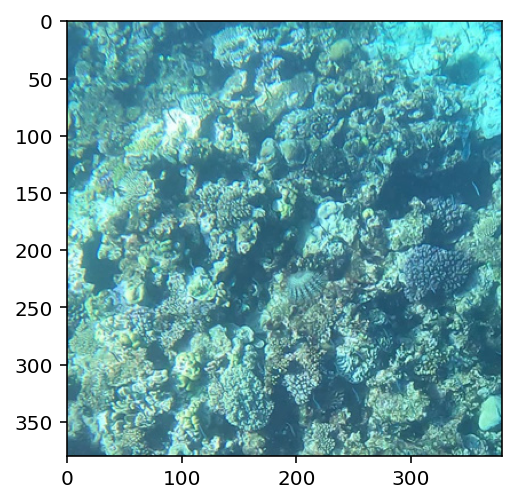

In [20]:
plt.imshow(img.transpose(1, 2, 0))

# model

In [21]:
# model = torch.hub.load(
#     "NVIDIA/DeepLearningExamples:torchhub", "nvidia_efficientnet_b4", pretrained=True
# )

# in_features = model.classifier.fc.in_features
# model.classifier.fc = torch.nn.Linear(in_features, 1)
# model.classifier


# model.load_state_dict(torch.load('/app/_data/effnet_torch/model.pth')['model_state_dict'])

# model = model.to(DEVICE)
# model = model.eval()
# with torch.no_grad():
#     model(torch.ones([1,3,380,380]).to(DEVICE)).detach().cpu().numpy()

In [22]:
from efficientnet_pytorch import EfficientNet

efficientnet = EfficientNet.from_pretrained("efficientnet-b7")


in_features = efficientnet._fc.in_features
efficientnet._fc = torch.nn.Linear(in_features, 1)
efficientnet._fc
efficientnet.load_state_dict(
    torch.load("/app/_data/eff_luk/effb7_best_rec.pth")["model_state_dict"]
)
efficientnet = efficientnet.to(DEVICE)
with torch.no_grad():
    efficientnet(torch.ones([1, 3, 380, 380]).to(DEVICE)).detach().cpu().numpy()

Loaded pretrained weights for efficientnet-b7


Linear(in_features=2560, out_features=1, bias=True)

<All keys matched successfully>

array([[4.5681686]], dtype=float32)

# test

In [23]:
test_dataloader = DataLoader(test_gen, batch_size=128, shuffle=False)

In [24]:
test_metrics = torchmetrics.MetricCollection(
    [
        torchmetrics.Accuracy(compute_on_step=False),
        torchmetrics.Precision(compute_on_step=False),
        torchmetrics.Recall(compute_on_step=False),
        torchmetrics.F1Score(compute_on_step=False),
    ]
)

In [25]:
def test_loop(model, dataloader, device, metric_fn, act_fn=torch.nn.Sigmoid()):
    model = model.eval()
    test_labels = []
    test_outputs = []
    with torch.no_grad():
        for (imgs, targets) in tqdm(dataloader):
            test_labels.extend(targets.numpy().tolist())
            imgs = imgs.to(device)
            targets = targets.to(device)
            output = act_fn(model(imgs))
            test_outputs.extend(output.detach().cpu().numpy().tolist())
            metric_fn.to(device)(output.squeeze(), targets)
            imgs = imgs.detach().cpu().numpy()
            targets = targets.detach().cpu().numpy()
    met = metric_fn.compute()
    acc = met["Accuracy"].detach().cpu().numpy()
    prec = met["Precision"].detach().cpu().numpy()
    recall = met["Recall"].detach().cpu().numpy()
    f1 = met["F1Score"].detach().cpu().numpy()
    metric_fn.reset()

    print(f"Test accuracy: {acc}, recall: {recall}, precision {prec}, f1score: {f1}")
    return test_outputs, test_labels, acc, recall, prec, f1

In [27]:
test_outputs, test_labels, acc, recall, prec, f1 = test_loop(
    efficientnet, test_dataloader, DEVICE, test_metrics, act_fn=torch.nn.Sigmoid()
)

100% 115/115 [03:14<00:00,  1.69s/it]

Test accuracy: 0.9496535062789917, recall: 0.9923766851425171, precision 0.9540849328041077, f1score: 0.9728540778160095


# test on full imgs

In [36]:
coord = [
    [[0, 380], [0, 380]],
    [[0, 380], [300, 680]],
    [[0, 380], [600, 980]],
    [[0, 380], [900, 1280]],
    [[340, 720], [0, 380]],
    [[340, 720], [300, 680]],
    [[340, 720], [600, 980]],
    [[340, 720], [900, 1280]],
]


def cut_image(image, sliding_window_coordinates):
    """
    Output is an array of small images from the original image according
    to coordinates from get_cut_coord()
    """

    list_images = []
    for y, x in sliding_window_coordinates:
        small_image = image[y[0] : y[1], x[0] : x[1], :].astype("float32")
        small_image = small_image - small_image.min()
        small_image = small_image / small_image.max()
        list_images.append(small_image.transpose(2, 0, 1))
    return np.array(list_images)

In [32]:
def plot_bboxes(img_path, img, df):
    if img is None:
        img = np.array(Image.open(img_path))
    img_w, img_h = img.shape[:2]
    fig, ax = plt.subplots(1, 1, figsize=(15, 8))
    ax.imshow(img)
    gt_bboxes = df.query("img_path == @img_path")["annotations"].values[0]
    for i in range(len(gt_bboxes)):
        x_min, y_min, width, height = (
            gt_bboxes[i]["x"],
            gt_bboxes[i]["y"],
            gt_bboxes[i]["width"],
            gt_bboxes[i]["height"],
        )
        rect = plt.Rectangle([x_min, y_min], width, height, ec="b", fc="none", lw=3.0)
        ax.add_patch(rect)
    plt.show();

array([[0.928],
       [0.   ],
       [0.632],
       [1.   ],
       [0.973],
       [0.999],
       [1.   ],
       [1.   ]], dtype=float32)

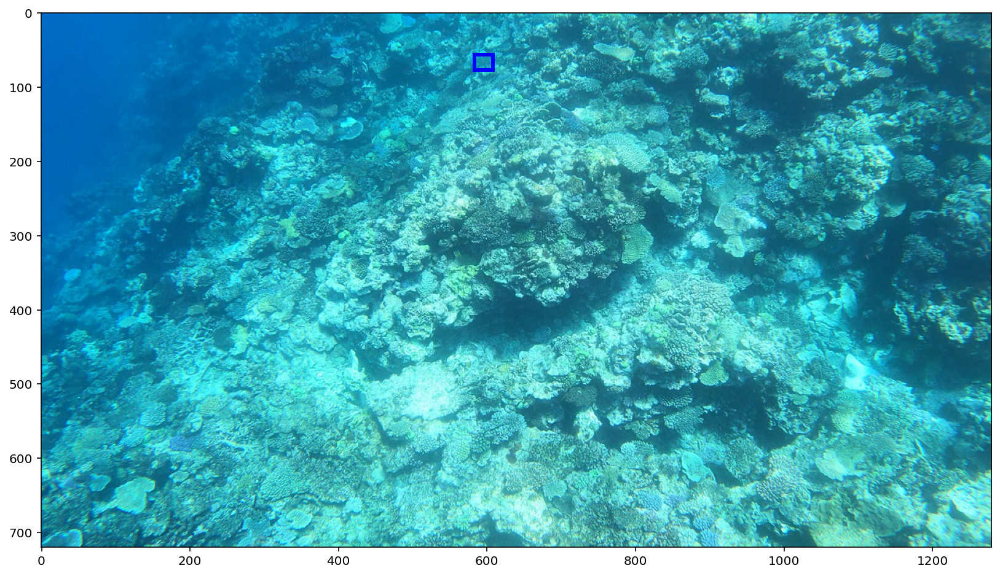

In [38]:
img_path = df.query("len_annotation > 0").sample()["img_path"].values[0]
img = np.array(Image.open(img_path))
list_images = cut_image(img, coord)
with torch.no_grad():
    im = torch.tensor(list_images).to(DEVICE).float()
    pred = torch.nn.Sigmoid()(efficientnet(im)).detach().cpu().numpy()
np.round(pred, 3)
%matplotlib inline
plot_bboxes(img_path=img_path, img=img, df=df)

# Full test

In [78]:
pred_df = pd.read_csv("/app/_data/pred.csv")
pred_df = pred_df[pred_df["pred"].notna()]

In [46]:
l = []
for ix in tqdm(df.query("len_annotation==0").index.tolist()):
    img_path = df.loc[ix, "img_path"]
    img = np.array(Image.open(img_path))
    list_images = cut_image(img, coord)
    with torch.no_grad():
        im = torch.tensor(list_images).to(DEVICE).float()
        pred = torch.nn.Sigmoid()(efficientnet(im)).detach().cpu().numpy()
    l.append(pred)

100% 18582/18582 [35:56<00:00,  8.62it/s]


In [47]:
prediction = np.array(l)

In [117]:
idxs = df.query("len_annotation==0").index.tolist()

for i in range(len(prediction)):
    ix = idxs[i]
    for n in range(8):
        df.loc[ix, f"pred_{n}"] = prediction[i][n]

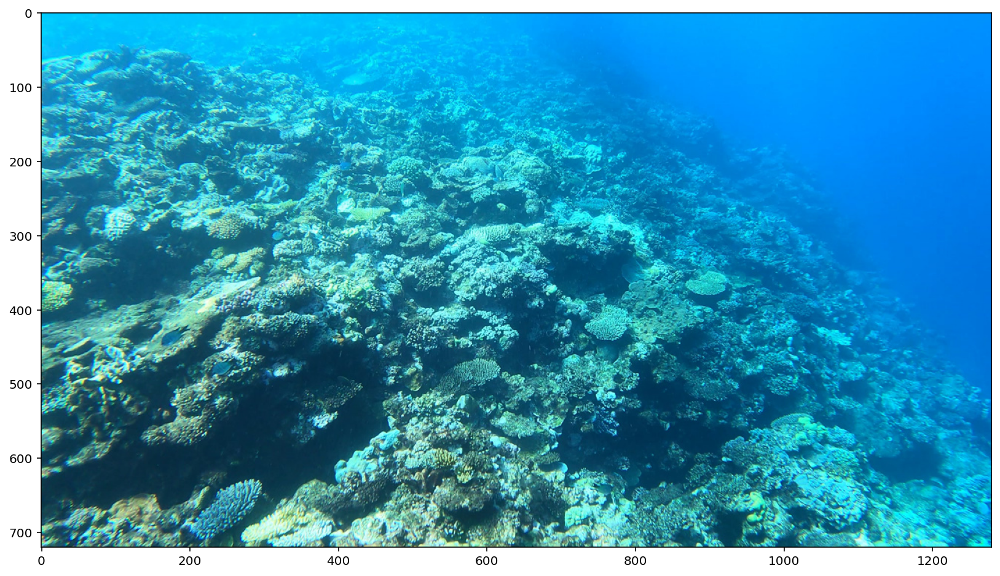

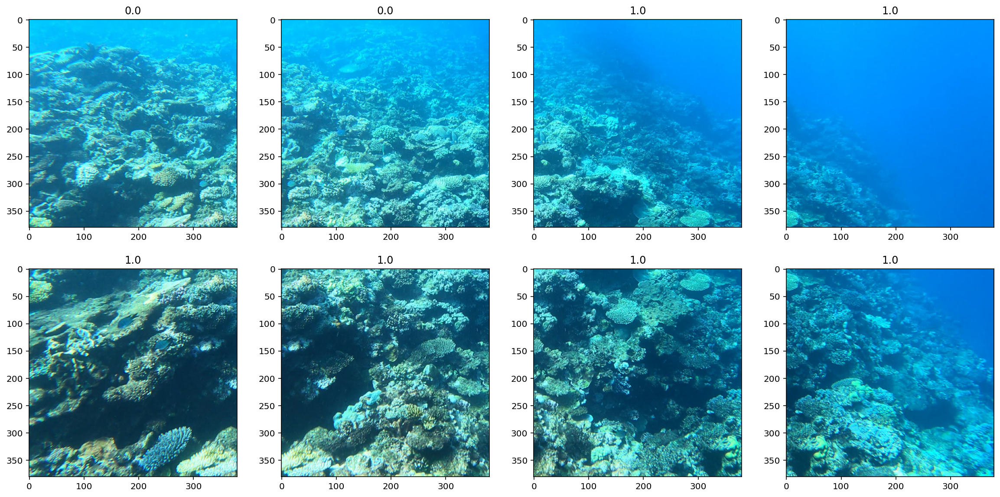

In [98]:
idxs = df.query("len_annotation==0").index.tolist()

ix = idxs[15908]
ix = 322
img_path = df.loc[ix, "img_path"]
img_id = df.loc[ix, "image_id"]
img = np.array(Image.open(img_path))
list_images = cut_image(img, coord)
with torch.no_grad():
    im = torch.tensor(list_images).to(DEVICE).float()
    pred = torch.nn.Sigmoid()(efficientnet(im)).detach().cpu().numpy()
np.round(pred, 3)
%matplotlib inline
plot_bboxes(img_path=img_path, img=img, df=df)

plt.figure(figsize=(20, 15))
for i in range(len(list_images)):
    plt.subplot(3, 4, i + 1)
    plt.title(f"{np.round(pred[i][0])}")
    plt.imshow(list_images[i].transpose(1, 2, 0))
plt.show();

In [89]:
pred_df["score"] = pred_df["pred"].str.split().str[0].astype("float")

In [97]:
for ix in pred_df[pred_df["score"] > 0.25].index:
    pr_ix = idxs.index(ix)
    if (prediction[pr_ix] < 0.5).sum() != 0:
        ix, pred_df.loc[ix, "score"]

(231, 0.3436773121356964)

(322, 0.7501212954521179)

(323, 0.6203343272209167)

(324, 0.767163097858429)

(384, 0.6742861866950989)

(435, 0.4274211525917053)

(484, 0.770274817943573)

(555, 0.760879397392273)

(1438, 0.5739631056785583)

(3032, 0.5465524196624756)

(4060, 0.29124680161476135)

(4660, 0.25256168842315674)

(9900, 0.4287600517272949)

In [100]:
l1 = []
for ix in tqdm(df.query("len_annotation==1").index.tolist()):
    img_path = df.loc[ix, "img_path"]
    img = np.array(Image.open(img_path))
    list_images = cut_image(img, coord)
    with torch.no_grad():
        im = torch.tensor(list_images).to(DEVICE).float()
        pred = torch.nn.Sigmoid()(efficientnet(im)).detach().cpu().numpy()
    l1.append(pred)

100% 2801/2801 [05:24<00:00,  8.63it/s]


In [101]:
prediction1 = np.array(l1)

In [118]:
idxs = df.query("len_annotation==1").index.tolist()

for i in range(len(prediction1)):
    ix = idxs[i]
    for n in range(8):
        df.loc[ix, f"pred_{n}"] = prediction1[i][n]

In [121]:
for ix in pred_df.index:
    df.loc[ix, "yolo_pred"] = pred_df.loc[ix, "pred"]
    df.loc[ix, "yolo_score"] = pred_df.loc[ix, "score"]

In [127]:
pred_df1 = pd.read_csv("/app/_data/pred_1.csv")
pred_df1 = pred_df1[pred_df1["pred"].notna()]

In [128]:
pred_df1

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,img_path,len_annotation,width_max,width_min,height_max,height_min,width_mean,height_mean,max_iou,pred
16,0,40258,16,16,0_16,"[{'x': 559, 'y': 213, 'width': 50, 'height': 32}]",/kaggle/input/tensorflow-great-barrier-reef/tr...,1,50.0,50.0,32.0,32.0,50.0,32.0,NaN,0.6365048885345459 560 211 45 33 0.21871584653...
21,0,40258,21,21,0_21,"[{'x': 550, 'y': 214, 'width': 50, 'height': 32}]",/kaggle/input/tensorflow-great-barrier-reef/tr...,1,50.0,50.0,32.0,32.0,50.0,32.0,NaN,0.7775974869728088 545 212 52 40 0.26003551483...
26,0,40258,26,26,0_26,"[{'x': 525, 'y': 196, 'width': 63, 'height': 51}]",/kaggle/input/tensorflow-great-barrier-reef/tr...,1,63.0,63.0,51.0,51.0,63.0,51.0,NaN,0.7702631950378418 526 199 62 48 0.49517929553...
31,0,40258,31,31,0_31,"[{'x': 518, 'y': 171, 'width': 71, 'height': 55}]",/kaggle/input/tensorflow-great-barrier-reef/tr...,1,71.0,71.0,55.0,55.0,71.0,55.0,NaN,0.8118214011192322 517 169 70 53 0.51550853252...
61,0,40258,61,61,0_61,"[{'x': 532, 'y': 474, 'width': 134, 'height': ...",/kaggle/input/tensorflow-great-barrier-reef/tr...,1,134.0,134.0,119.0,119.0,134.0,119.0,NaN,0.8077737092971802 517 466 161 134 0.159820690...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21605,2,29859,8864,1092,2_8864,"[{'x': 452, 'y': 577, 'width': 58, 'height': 39}]",/kaggle/input/tensorflow-great-barrier-reef/tr...,1,58.0,58.0,39.0,39.0,58.0,39.0,NaN,0.11283161491155624 450 574 60 37
21610,2,29859,8869,1097,2_8869,"[{'x': 437, 'y': 679, 'width': 64, 'height': 39}]",/kaggle/input/tensorflow-great-barrier-reef/tr...,1,64.0,64.0,39.0,39.0,64.0,39.0,NaN,0.10132630914449692 485 702 80 17
23363,2,29859,10622,2850,2_10622,"[{'x': 107, 'y': 354, 'width': 39, 'height': 26}]",/kaggle/input/tensorflow-great-barrier-reef/tr...,1,39.0,39.0,26.0,26.0,39.0,26.0,NaN,0.7242798805236816 110 352 35 29 0.33404368162...
23368,2,29859,10627,2855,2_10627,"[{'x': 101, 'y': 498, 'width': 40, 'height': 34}]",/kaggle/input/tensorflow-great-barrier-reef/tr...,1,40.0,40.0,34.0,34.0,40.0,34.0,NaN,0.6446883082389832 104 496 39 32 0.12773509323...


In [130]:
pred_df1["score"] = pred_df1["pred"].str.split().str[0].astype("float")

In [131]:
for ix in pred_df1.index:
    df.loc[ix, "yolo_pred"] = pred_df1.loc[ix, "pred"]
    df.loc[ix, "yolo_score"] = pred_df1.loc[ix, "score"]

In [132]:
df.to_csv("/app/_data/eff_yolo_pred.csv", index=False)

In [2]:
df = pd.read_csv("/app/_data/eff_yolo_pred.csv")

In [3]:
df["empty"] = (
    df[["pred_0", "pred_1", "pred_2", "pred_3", "pred_4", "pred_5", "pred_6", "pred_7"]]
    >= 0.6
).sum(1)

In [4]:
df["empty"] = df["empty"] == 8

In [5]:
df.query("empty==True and len_annotation!=0 and yolo_score>0.0001")[
    "yolo_score"
].describe(percentiles=[0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.5, 0.75, 0.85, 0.9, 0.95])

count    63.000000
mean      0.735063
std       0.114698
min       0.188807
1%        0.364907
5%        0.500840
10%       0.571270
15%       0.618389
20%       0.706303
25%       0.741947
50%       0.772812
75%       0.795619
85%       0.809105
90%       0.814325
95%       0.825906
max       0.838829
Name: yolo_score, dtype: float64

In [6]:
df.query("empty==True and len_annotation==0 and yolo_score>0.0001")[
    "yolo_score"
].describe(percentiles=[0.01, 0.05, 0.1, 0.15, 0.2, 0.25, 0.5, 0.75, 0.85, 0.9, 0.95])

count    838.000000
mean       0.258735
std        0.142792
min        0.100040
1%         0.101571
5%         0.110272
10%        0.118656
15%        0.128132
20%        0.137726
25%        0.148867
50%        0.212353
75%        0.332590
85%        0.407496
90%        0.479069
95%        0.562618
max        0.774460
Name: yolo_score, dtype: float64

In [158]:
df.query("empty==True and len_annotation!=0 and yolo_score>0.0001")

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,img_path,len_annotation,new_img_path,label,...,pred_1,pred_2,pred_3,pred_4,pred_5,pred_6,pred_7,yolo_pred,yolo_score,empty
1280,0,59337,1853,2,0_1853,"[{'x': 278, 'y': 368, 'width': 38, 'height': 19}]",/app/_data/tensorflow-great-barrier-reef/train...,1,/app/_data/images/0_1853.jpg,1,...,0.999414,0.999533,0.997086,0.965284,0.996283,0.999734,0.998469,0.7914297580718994 278 365 33 22,0.791430,True
1357,0,59337,1930,79,0_1930,"[{'x': 1224, 'y': 457, 'width': 55, 'height': ...",/app/_data/tensorflow-great-barrier-reef/train...,1,/app/_data/images/0_1930.jpg,1,...,0.999949,0.996011,0.998916,0.999979,0.999272,0.999863,0.970207,0.5704346299171448 1240 466 39 68 0.1722791641...,0.570435,True
1701,0,59337,2274,423,0_2274,"[{'x': 593, 'y': 201, 'width': 31, 'height': 29}]",/app/_data/tensorflow-great-barrier-reef/train...,1,/app/_data/images/0_2274.jpg,1,...,0.999940,0.999847,0.999409,0.998558,0.999821,0.999991,0.999452,0.7565252780914307 592 202 30 26 0.20711472630...,0.756525,True
1706,0,59337,2279,428,0_2279,"[{'x': 585, 'y': 228, 'width': 32, 'height': 31}]",/app/_data/tensorflow-great-barrier-reef/train...,1,/app/_data/images/0_2279.jpg,1,...,0.999932,0.999977,0.999403,0.999582,0.995477,0.999946,0.999948,0.7714635729789734 584 229 32 28 0.46594965457...,0.771464,True
1711,0,59337,2284,433,0_2284,"[{'x': 571, 'y': 248, 'width': 34, 'height': 32}]",/app/_data/tensorflow-great-barrier-reef/train...,1,/app/_data/images/0_2284.jpg,1,...,0.999999,0.999545,0.999292,0.999388,0.999179,0.999919,0.999819,0.7539820075035095 571 250 34 30 0.10580964386...,0.753982,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7553,1,60510,845,845,1_845,"[{'x': 1047, 'y': 119, 'width': 77, 'height': ...",/app/_data/tensorflow-great-barrier-reef/train...,1,/app/_data/images/1_845.jpg,1,...,0.999981,1.000000,0.942341,0.999712,0.999694,0.999444,0.999997,0.8160781264305115 1050 116 69 66,0.816078,True
7558,1,60510,850,850,1_850,"[{'x': 1099, 'y': 189, 'width': 77, 'height': ...",/app/_data/tensorflow-great-barrier-reef/train...,1,/app/_data/images/1_850.jpg,1,...,0.999974,1.000000,0.965047,0.999701,0.998799,0.999155,0.999999,0.7749234437942505 1101 189 73 75,0.774923,True
7563,1,60510,855,855,1_855,"[{'x': 1142, 'y': 283, 'width': 82, 'height': ...",/app/_data/tensorflow-great-barrier-reef/train...,1,/app/_data/images/1_855.jpg,1,...,0.999999,0.999996,0.999950,0.999996,0.999981,0.999998,0.999998,0.7634962201118469 1147 279 77 77 0.4816864132...,0.763496,True
7568,1,60510,860,860,1_860,"[{'x': 1184, 'y': 377, 'width': 86, 'height': ...",/app/_data/tensorflow-great-barrier-reef/train...,1,/app/_data/images/1_860.jpg,1,...,0.999999,0.999999,0.999994,0.999985,1.000000,0.999988,0.999931,0.7955186367034912 1191 380 80 84 0.2740128934...,0.795519,True


In [159]:
df.query("empty==True and len_annotation==0 and yolo_score>0.0001")

,video_id,sequence,video_frame,sequence_frame,image_id,annotations,img_path,len_annotation,new_img_path,label,...,pred_1,pred_2,pred_3,pred_4,pred_5,pred_6,pred_7,yolo_pred,yolo_score,empty
0,0,40258,0,0,0_0,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/0_0.jpg,0,...,0.999972,0.994645,0.999237,0.999924,0.999994,0.998556,0.999967,0.25971519947052 587 39 30 32,0.259715,True
1,0,40258,1,1,0_1,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/0_1.jpg,0,...,0.999968,0.999540,0.996884,0.999888,0.999991,0.997082,0.999868,0.39534759521484375 37 176 36 26 0.20428285002...,0.395348,True
2,0,40258,2,2,0_2,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/0_2.jpg,0,...,0.999973,0.999879,0.998456,0.999992,0.999995,0.992949,0.999995,0.4926989674568176 32 187 36 25,0.492699,True
3,0,40258,3,3,0_3,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/0_3.jpg,0,...,0.999623,0.999882,0.998946,0.999999,0.999979,0.994368,0.999975,0.3650210201740265 655 69 23 22 0.205853819847...,0.365021,True
4,0,40258,4,4,0_4,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/0_4.jpg,0,...,0.999394,0.999952,0.998115,0.999954,0.999992,0.803446,0.999779,0.14414119720458984 163 44 30 27 0.14138668775...,0.144141,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23389,2,29859,10648,2876,2_10648,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/2_10648.jpg,0,...,0.999958,0.999991,0.999994,0.999882,0.999848,1.000000,0.999993,0.18205823004245758 1247 546 32 32 0.122604466...,0.182058,True
23429,2,29859,10688,2916,2_10688,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/2_10688.jpg,0,...,0.999841,0.998899,0.999462,0.999991,0.999856,0.999991,0.999942,0.5013756155967712 654 544 63 39,0.501376,True
23430,2,29859,10689,2917,2_10689,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/2_10689.jpg,0,...,0.999243,0.999272,0.999845,0.999922,0.999919,0.999990,0.999998,0.5755174160003662 652 552 71 39 0.14794775843...,0.575517,True
23469,2,29859,10728,2956,2_10728,[],/app/_data/tensorflow-great-barrier-reef/train...,0,/app/_data/images/2_10728.jpg,0,...,0.999975,0.999997,0.999999,0.999827,0.999983,0.999999,0.999979,0.3143461346626282 154 620 66 58,0.314346,True
